# DRY BEANS CLASSIFICATION

In this project, classification models were developed to distinguish between 7 different types of dry beans. The dataset consist of 13,611 dry bean samples, 16 shape features in total.

#### Data Set Information

Seven different types of dry beans were used in this research, taking into account the features such as form, shape, type, and structure by the market situation. A computer vision system was developed to distinguish seven different registered varieties of dry beans with similar features in order to obtain uniform seed classification. For the classification model, images of 13,611 grains of 7 different registered dry beans were taken with a high-resolution camera. Bean images obtained by computer vision system were subjected to segmentation and feature extraction stages, and a total of 16 features; 12 dimensions and 4 shape forms, were obtained from the grains.

#### Attribute Information

1) Area (A): The area of a bean zone and the number of pixels within its boundaries.

2) Perimeter (P): Bean circumference is defined as the length of its border. 

3) Major axis length (L): The distance between the ends of the longest line that can be drawn from a bean. 

4) Minor axis length (l): The longest line that can be drawn from the bean while standing perpendicular to the main axis. 

5) Aspect ratio (K): Defines the relationship between L and l. 

6) Eccentricity (Ec): Eccentricity of the ellipse having the same moments as the region.

7) Convex area (C): Number of pixels in the smallest convex polygon that can contain the area of a bean seed. 

8) Equivalent diameter (Ed): The diameter of a circle having the same area as a bean seed area. 

9) Extent (Ex): The ratio of the pixels in the bounding box to the bean area. 

10) Solidity (S): Also known as convexity. The ratio of the pixels in the convex shell to those found in beans. 

11) Roundness (R): Calculated with the following formula: (4piA)/(P^2) 

12) Compactness (CO): Measures the roundness of an object: Ed/L 

13) ShapeFactor1 (SF1)

14) ShapeFactor2 (SF2)

15) ShapeFactor3 (SF3)

16) ShapeFactor4 (SF4) 

17) Class (Seker, Barbunya, Bombay, Cali, Dermason, Horoz and Sira) 

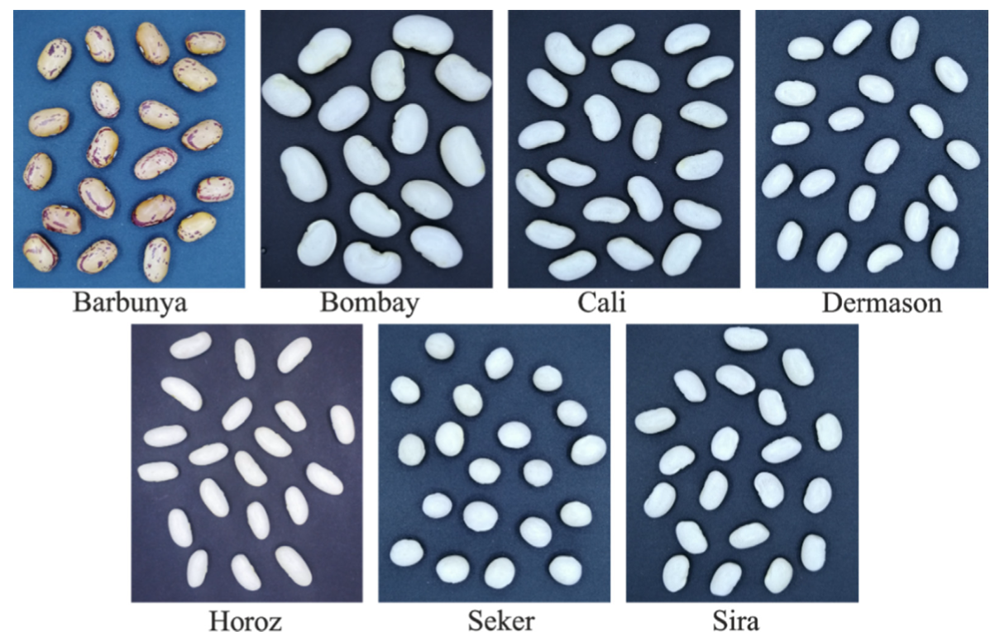

## Exploratory Data Analysis

In [1]:
# Importing libraries
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
sns.set_style("darkgrid")
%matplotlib inline 
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
from sklearn.preprocessing import PowerTransformer
from sklearn.ensemble import VotingClassifier

In [2]:
# Loading dataset
data = pd.read_csv('Dry_Beans_Dataset.csv')

In [3]:
data.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

In [5]:
data.shape

(13611, 17)

In [6]:
data.isnull().sum()

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

In [7]:
data.duplicated().sum()

68

In [8]:
#subset: To remove duplicates on specific column(s)
#keep: Determines which duplicates to keep
data.drop_duplicates(subset=None, keep='first', inplace=True)

In [9]:
data.duplicated().sum()

0

In [10]:
data.shape

(13543, 17)

In [11]:
data["Class"].value_counts()

DERMASON    3546
SIRA        2636
SEKER       2027
HOROZ       1860
CALI        1630
BARBUNYA    1322
BOMBAY       522
Name: Class, dtype: int64

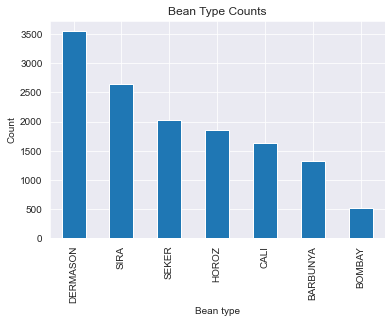

In [12]:
data["Class"].value_counts().plot(kind='bar', 
                                   title= "Bean Type Counts",
                                   xlabel= 'Bean type',
                                   ylabel= 'Count');

### UNIVARIATE ANALYSIS

The purpose is to summarize and find the patterns in the data.
It is not analyzed that the relation of variables to each other.

In [13]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Area,13543.0,53048.460385,29392.438324,20420.000000,36282.500000,44580.000000,61382.000000,254616.000000
Perimeter,13543.0,854.993406,214.722684,524.736000,703.230000,793.896000,977.146500,1985.370000
MajorAxisLength,13543.0,319.895602,85.809260,183.601165,253.086806,296.404589,376.312489,738.860153
MinorAxisLength,13543.0,202.365321,45.051632,122.512653,175.886357,192.491117,217.245403,460.198497
AspectRation,13543.0,1.581075,0.245245,1.024868,1.430662,1.549860,1.703916,2.430306
Eccentricity,13543.0,0.750315,0.091858,0.218951,0.715144,0.763997,0.809671,0.911423
ConvexArea,13543.0,53767.986709,29844.248525,20684.000000,36673.000000,45122.000000,62360.000000,263261.000000
EquivDiameter,13543.0,253.034094,59.307709,161.243764,214.933277,238.245711,279.560351,569.374358
Extent,13543.0,0.749829,0.048939,0.555315,0.718735,0.759903,0.786849,0.866195
Solidity,13543.0,0.987152,0.004650,0.919246,0.985678,0.988288,0.990019,0.994677


**The distributions of the observations on a single data variable:**

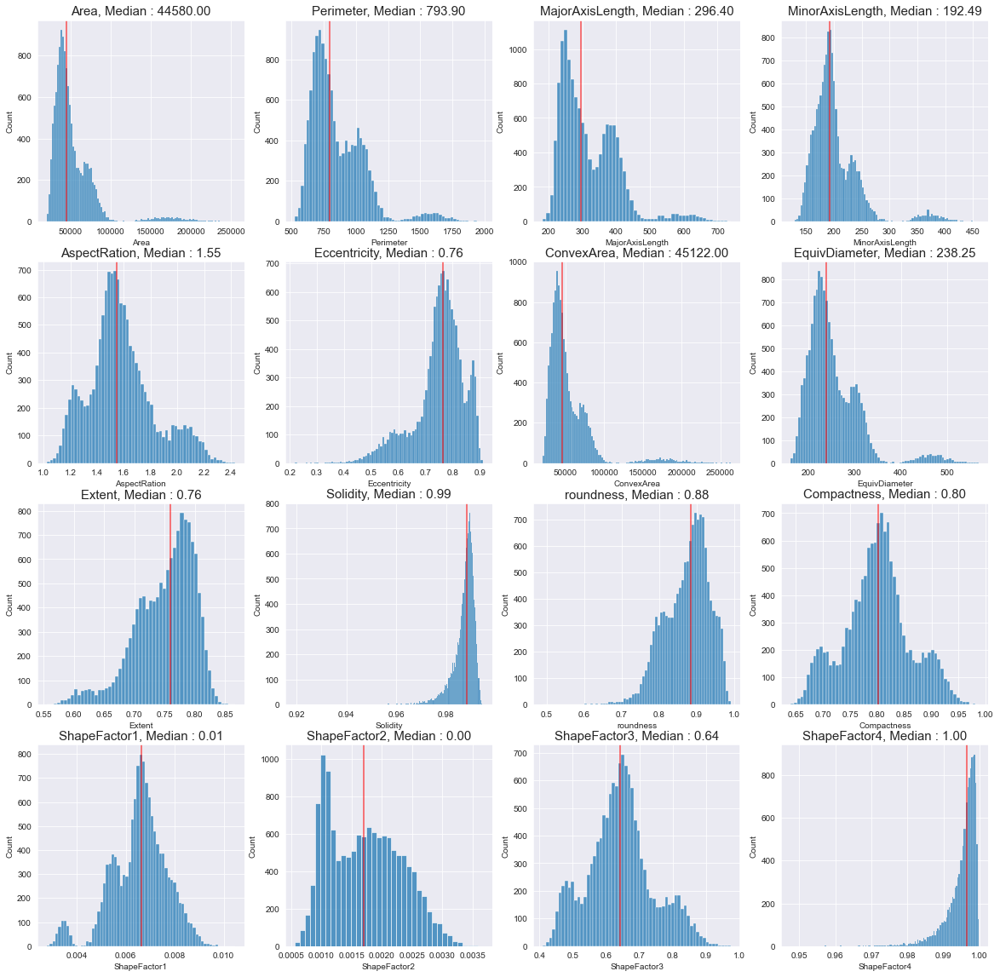

In [14]:
fig, ax_list = plt.subplots(nrows=4, ncols=4, figsize=(20,20))
for feature, ax in zip(data.columns.drop('Class'), ax_list.flatten()):
     sns.histplot(data= data, 
                  x=feature, 
                  ax=ax)
     median = data[feature].median()
     ax.set_title( f'{feature}, Median : {median:0.2f}',fontsize=15)
     ax.axvline(median,
            color ='red', 
            lw=2, 
            alpha=0.5)
    

plt.show()

* It can be seen that there are outliers. These differences may have an important role for seperating the dry bean variety.

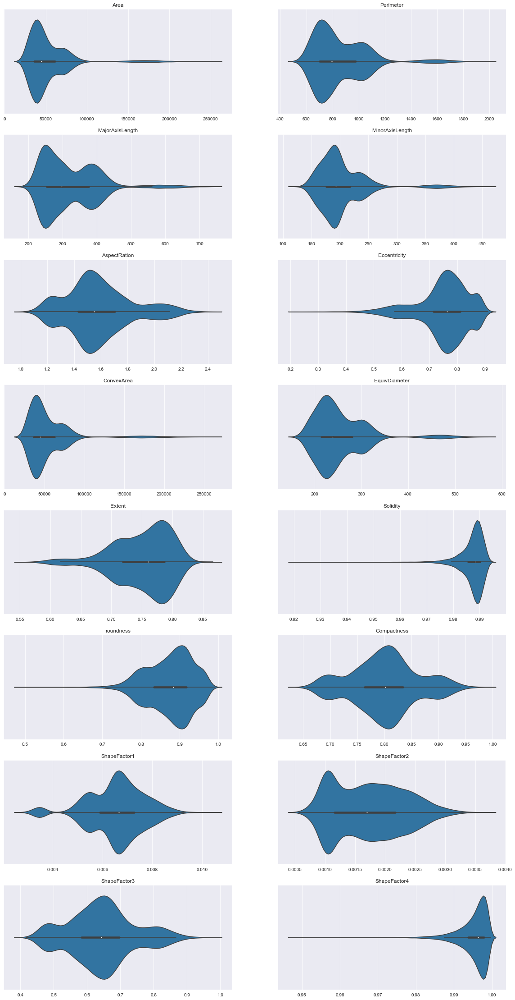

In [15]:
fig, axes = plt.subplots(8,2, figsize = (20,40))
for feature, ax in zip(data.columns.drop("Class"), axes.flatten()):
    sns.violinplot(data=data,x=feature,
                   ax=ax)
    ax.set_title( f'{feature}')
    ax.set(xlabel=None)
plt.show()

In [16]:
def histogram_boxplot(feature, figsize=(10,5), bins = None):
    
    f2, (ax_box2, ax_hist2) = plt.subplots(nrows = 2,
                                           sharex = True, 
                                           gridspec_kw = {"height_ratios": (.25, .75)}, 
                                           figsize = figsize) 
    
    sns.boxplot(x=feature, ax=ax_box2, showmeans=True, color='violet')
    sns.histplot(x=feature, kde=F, ax=ax_hist2, bins=bins,palette="winter") if bins else sns.histplot(feature, kde=False, ax=ax_hist2) 
    ax_hist2.axvline(np.mean(feature), color='green', linestyle='--') 
    ax_hist2.axvline(np.median(feature), color='black', linestyle='-') 

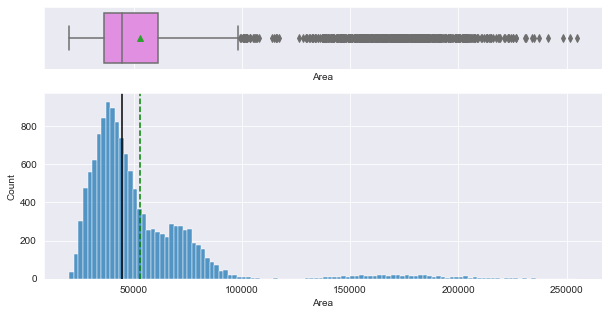

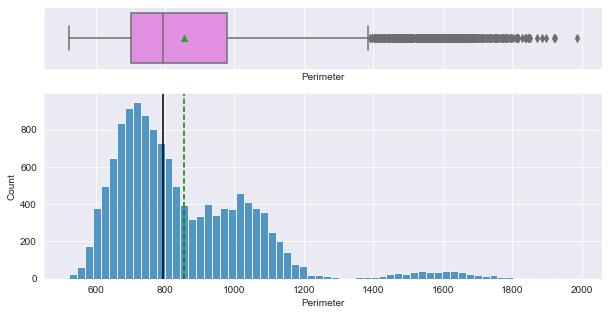

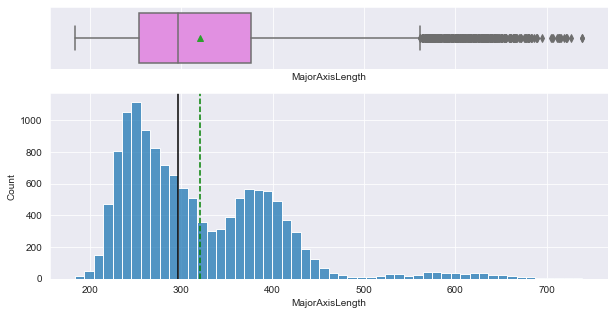

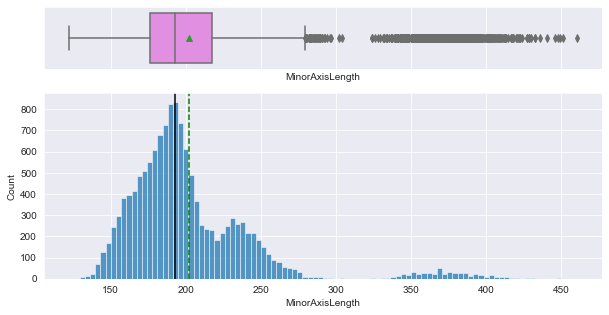

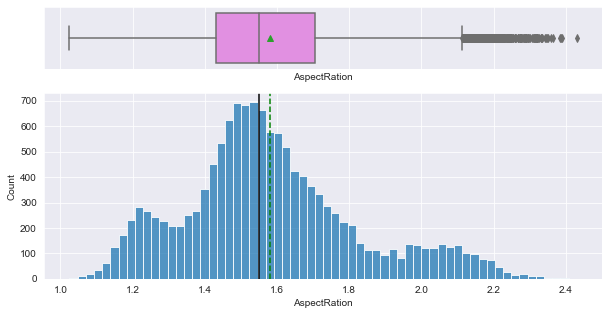

...

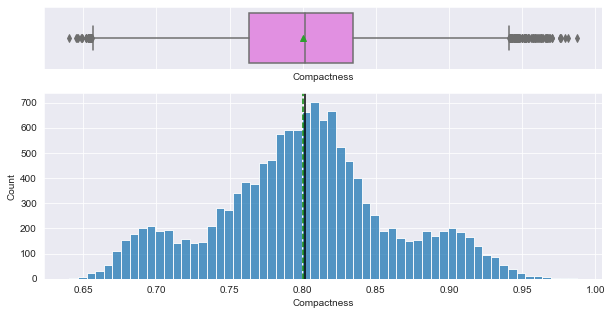

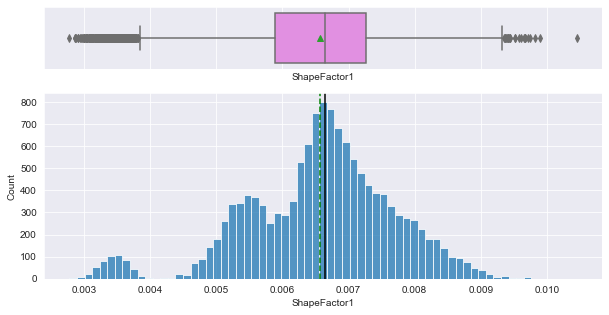

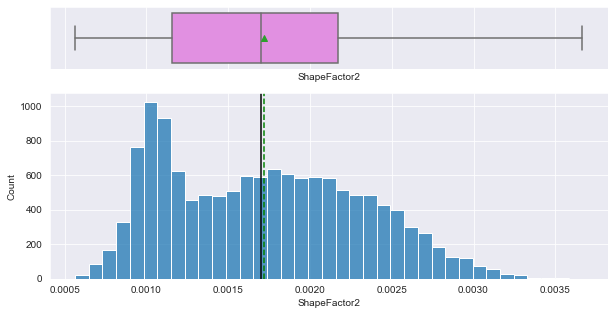

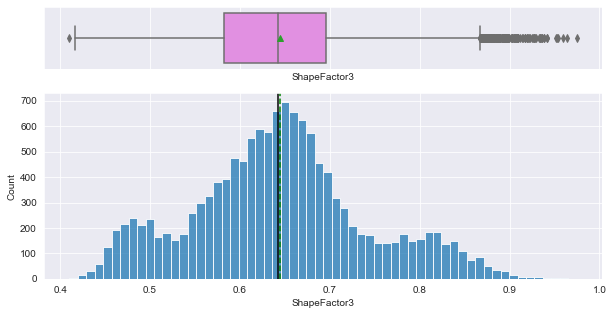

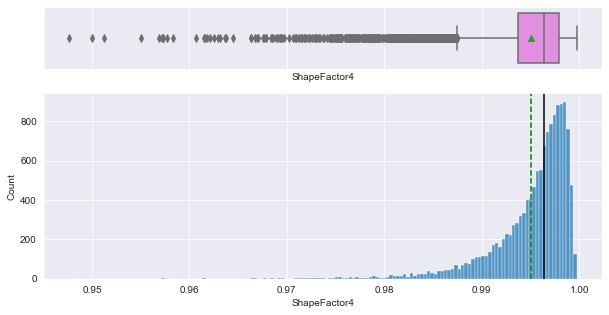

In [17]:

for col in data.columns.drop('Class'):
    histogram_boxplot(data[col])

In [18]:
feature_columns = [col for col in data.columns if col not in ['Class']]

skew_columns = (data[feature_columns].skew().sort_values(ascending=False))

print(skew_columns)

Area               2.947136
ConvexArea         2.936102
MinorAxisLength    2.232013
EquivDiameter      1.947303
Perimeter          1.628018
MajorAxisLength    1.365813
AspectRation       0.589045
ShapeFactor2       0.294332
ShapeFactor3       0.242767
Compactness        0.036309
ShapeFactor1      -0.530427
roundness         -0.648725
Extent            -0.895655
Eccentricity      -1.064932
Solidity          -2.546877
ShapeFactor4      -2.760125
dtype: float64


Most of the features have skewed distribution.

* Area, ConvexArea, MinorAxisLength are highly right-skewed features.
    
* Solidity, ShapeFactor4 are highly left-skewed features.
    
* EquivDiameter, Perimeter, MajorAxisLength are left-skewed features.
    
* Roundness, Extent, Eccentricity are right-skewed features.
    
* ShapeFactor1, ShapeFactor2, ShapeFactor3, Compactness, AspectRation are normally distributed features with no outliers.

### MULTIVARIATE ANALYSIS

**Amount of Correlation Between Features**

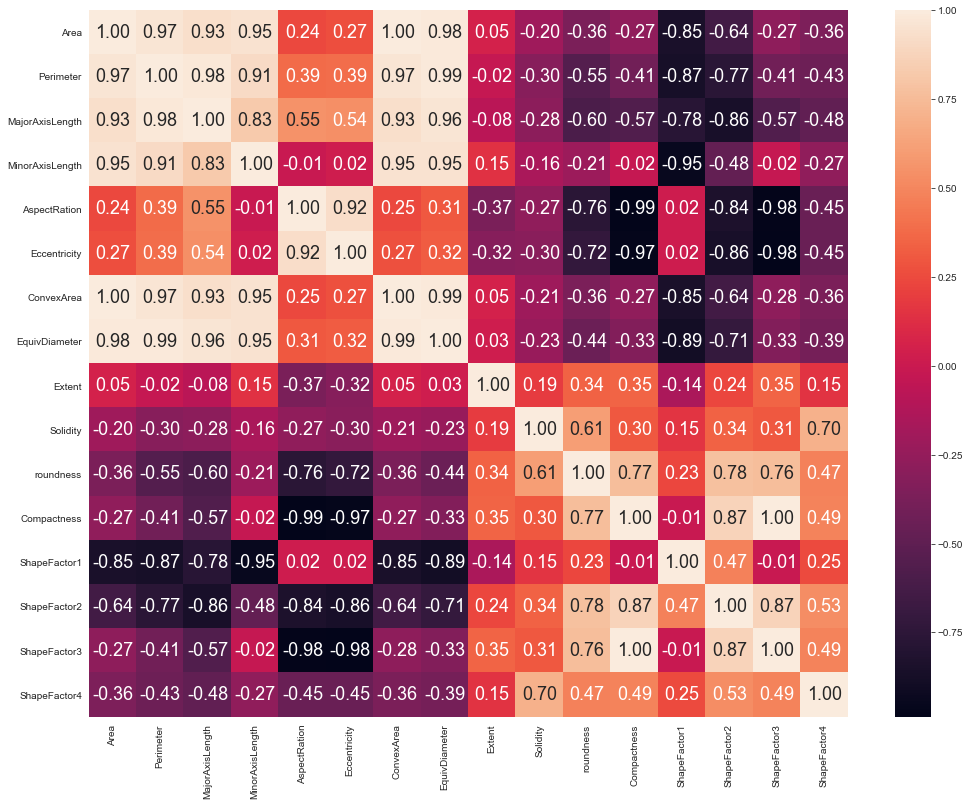

In [19]:
plt.figure(figsize = [17,13])
sns.heatmap(data.corr(),annot = True, fmt = '.2f',annot_kws={"size": 18});

**Correlated Features**

compactness - shape factor3 : 1.00

area - convex area : 1.00

area - perimeter: 0.97

area - equivalent diameter : 0.98

perimeter - major axis length : 0.98

perimeter - equivalent diameter : 0.99

perimeter - convex area : 0.97

major axis length - equivalent diameter : 0.96

minor axis length - equivalent diameter : 0.95

minor axis length - convex area : 0.95

convex area - equivalent diameter : 0.99

minor axis length - shape factor 1 : -0.95

eccentricity - compactness : -0.97

eccentricity - shape factor 3 : -0.98

aspect ration - compactness : -0.99

aspect ration - shape factor 3 : -0.98

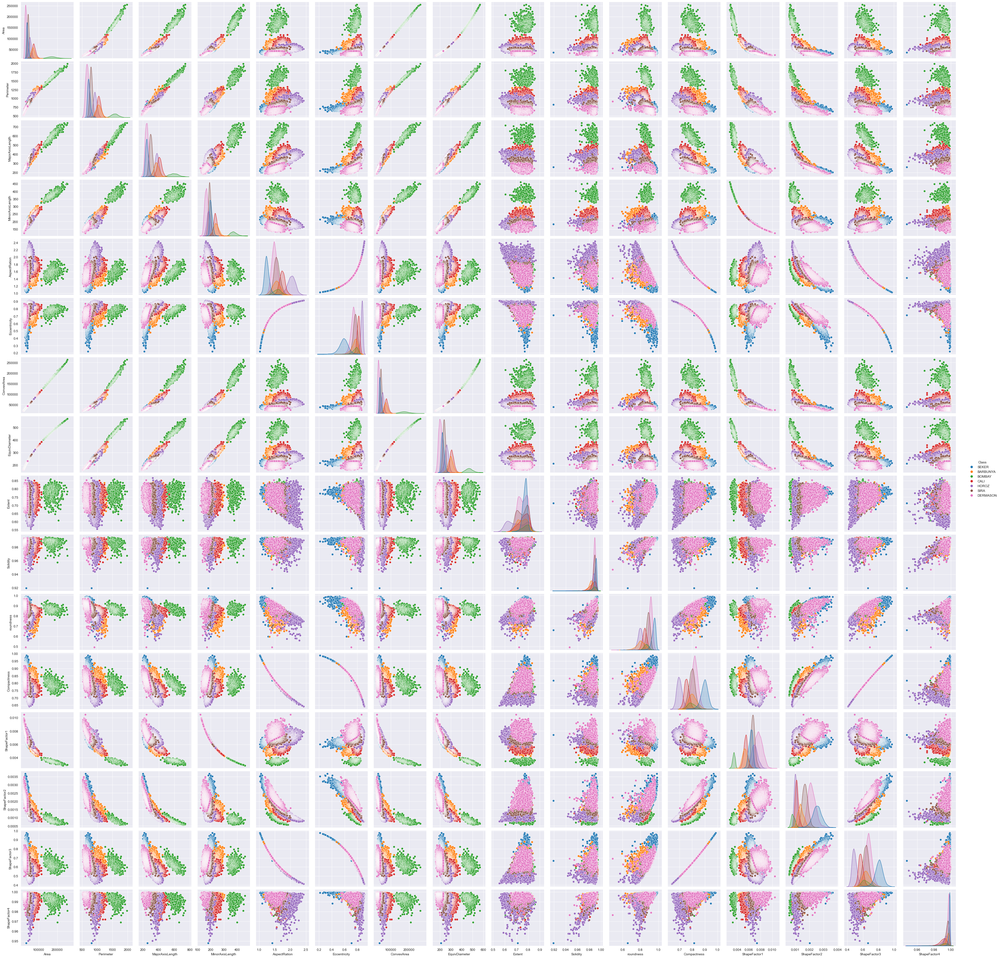

In [20]:
sns.pairplot(data, hue="Class")

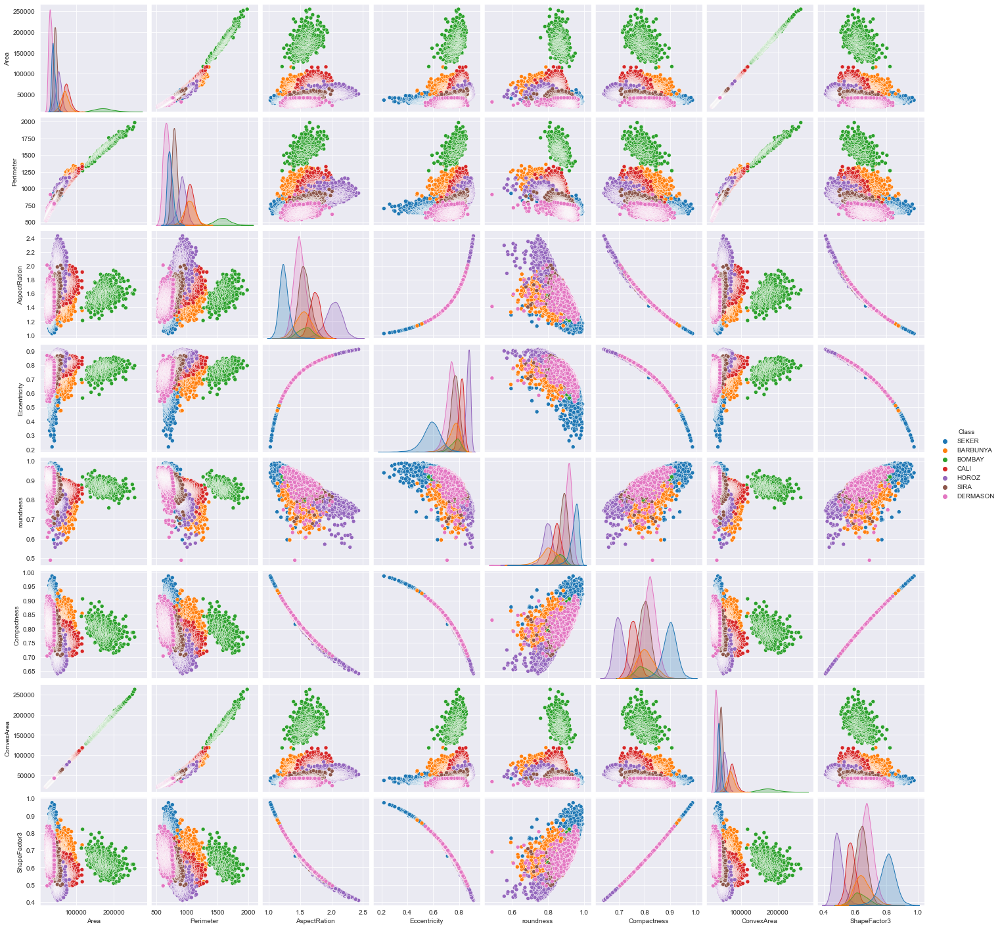

In [21]:
correlated_features = data[["Area","Perimeter","AspectRation","Eccentricity","roundness","Compactness", "ConvexArea", "ShapeFactor3", "Class"]]
sns.pairplot(correlated_features, hue="Class")

* Bombay is seperated from others.

* There is some overlap between classe but generally each class is divided into clusters.

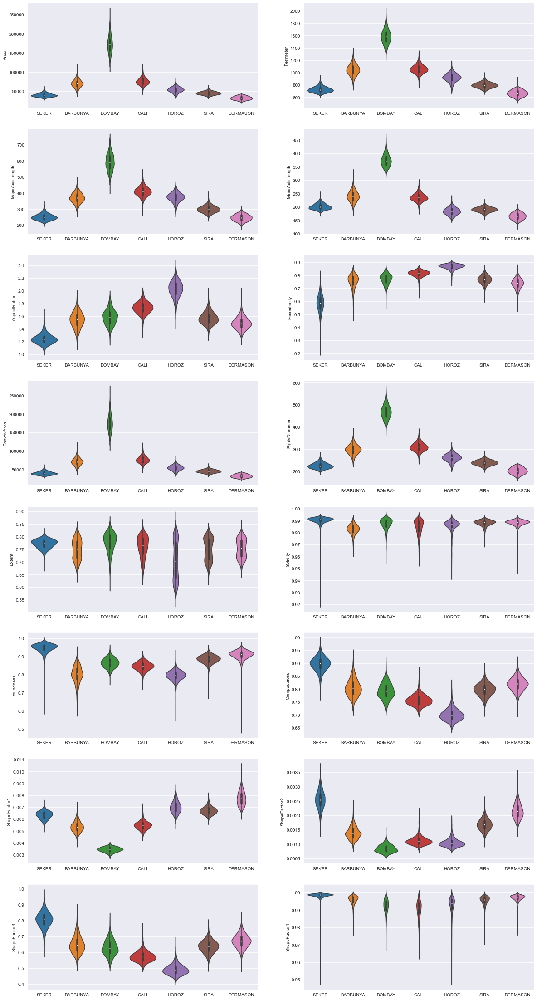

In [22]:
fig, axes = plt.subplots(8, 2, figsize = (20, 40))
for feature, ax in zip(data.columns.drop("Class"), axes.flatten()):
    sns.violinplot(data=data,
                   x="Class",
                   y=feature,
                   inner="box",
                   ax=ax)
    ax.set(xlabel=None)
plt.show()

* Bombay can be easily distinguished from other classes. It has larger area, perimeter, majoraxislength,convexarea and equivdiameter; it also has smaller shapefactor1.
* Barbunya-Cali, Sira-Dermason have similar distribution. It may be hard to distinguish these classes.

In [23]:
data.to_csv('data_clean.csv', index=False)

### SPLIT DATA INTO TRAIN AND TEST SET 

In [24]:
features = data.drop('Class', axis=1)
labels = data['Class']
x_train, x_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=42)

In [25]:
x_train.to_csv('x_train.csv', index=False)
x_test.to_csv('x_test.csv', index=False)
y_train.to_csv('y_train.csv', index=False)
y_train.to_csv('y_train.csv', index=False)

In [88]:
# The dataset for the pca method will be treated differently
X_train = x_train
X_test = x_test
Y_train = y_train
Y_test = y_test

### FEATURE SCALING

In [27]:
# Transformation to long-tailed columns
col= ['ShapeFactor4', 'Solidity', 'Eccentricity', 'roundness']  
power = PowerTransformer(method='yeo-johnson', standardize=False)
for c in col:
    x_train[c] = power.fit_transform(x_train[[c]])
    x_test[c] = power.transform(x_test[[c]])

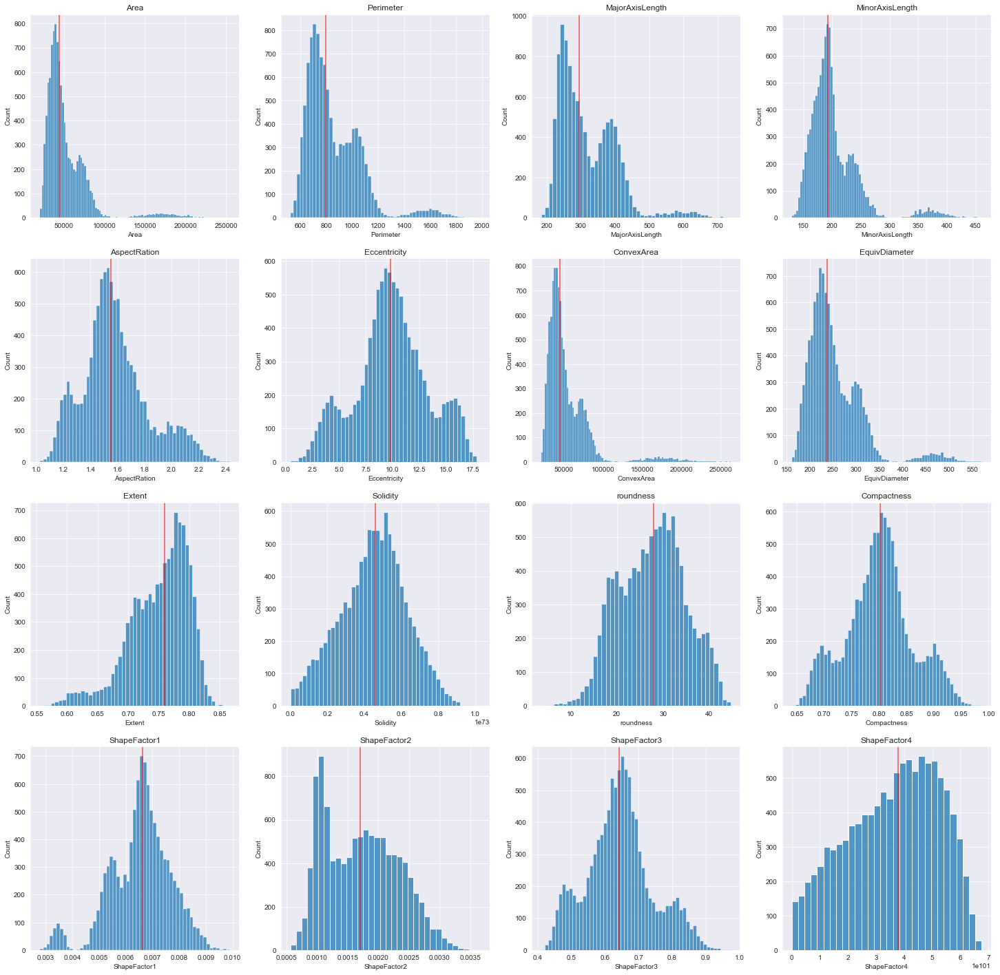

In [28]:
fig, ax_list = plt.subplots(nrows=4, ncols=4, figsize=(25,25))
for feature, ax in zip(x_train, ax_list.flatten()):
     sns.histplot(data= x_train, 
                  x=feature, 
                  ax=ax)
     median = x_train[feature].median()
     ax.set_title( f'{feature}')
     ax.axvline(median,
            color ='red', 
            lw=2, 
            alpha=0.5)
plt.show()

In [29]:
# Transformation to skewed columns
feature_columns = [col for col in data.columns if col not in ['Class']]
skew_columns = (data[feature_columns].skew().sort_values(ascending=False))
skew_columns = skew_columns.loc[skew_columns > 0.7]
skew_columns

Area               2.947136
ConvexArea         2.936102
MinorAxisLength    2.232013
EquivDiameter      1.947303
Perimeter          1.628018
MajorAxisLength    1.365813
dtype: float64

In [30]:
for col in skew_columns.index.tolist():
    x_train[col] = np.log1p(x_train[col])
    x_test[col] = np.log1p(x_test[col])

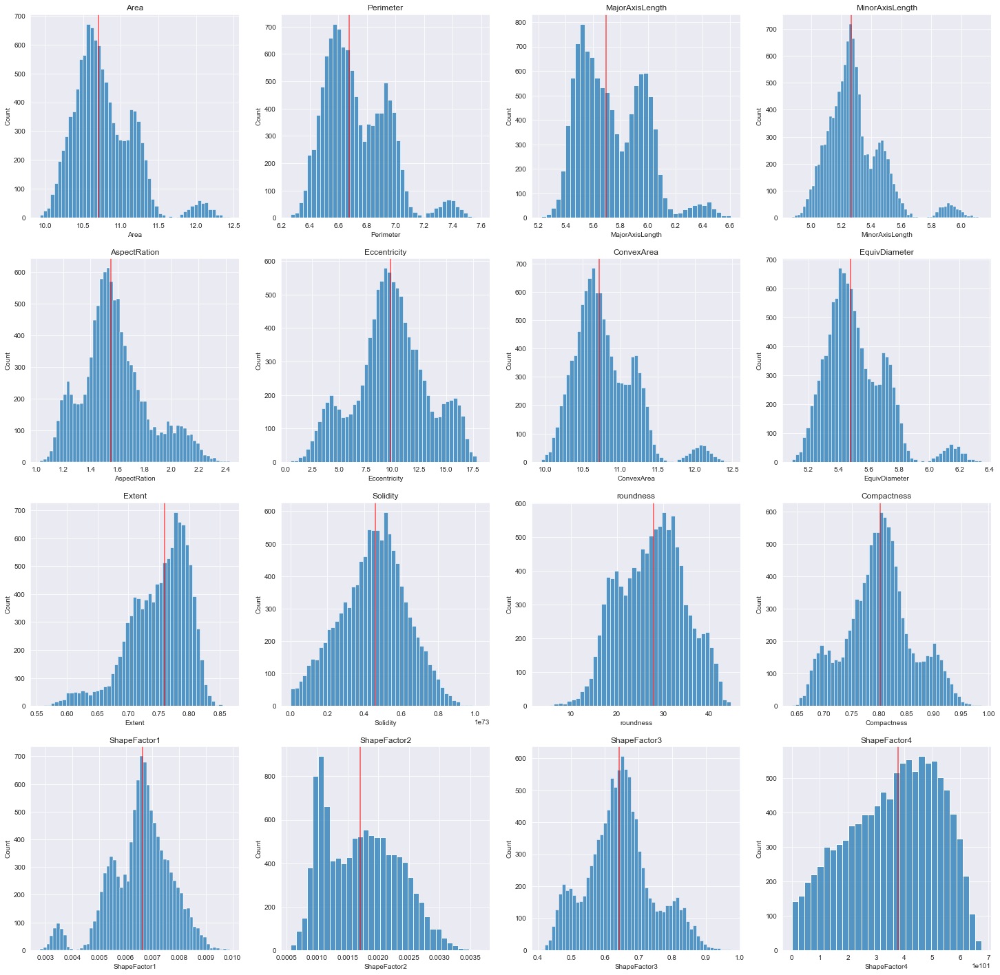

In [31]:
fig, ax_list = plt.subplots(nrows=4, ncols=4, figsize=(25,25))
for feature, ax in zip(x_train, ax_list.flatten()):
     sns.histplot(data= x_train, 
                  x=feature, 
                  ax=ax)
     median = x_train[feature].median()
     ax.set_title( f'{feature}')
     ax.axvline(median,
            color ='red', 
            lw=2, 
            alpha=0.5)
plt.show()

In [32]:
# Scaling all data
sc = StandardScaler()
x_train[feature_columns] = sc.fit_transform(x_train[feature_columns])
x_test[feature_columns] = sc.transform(x_test[feature_columns])

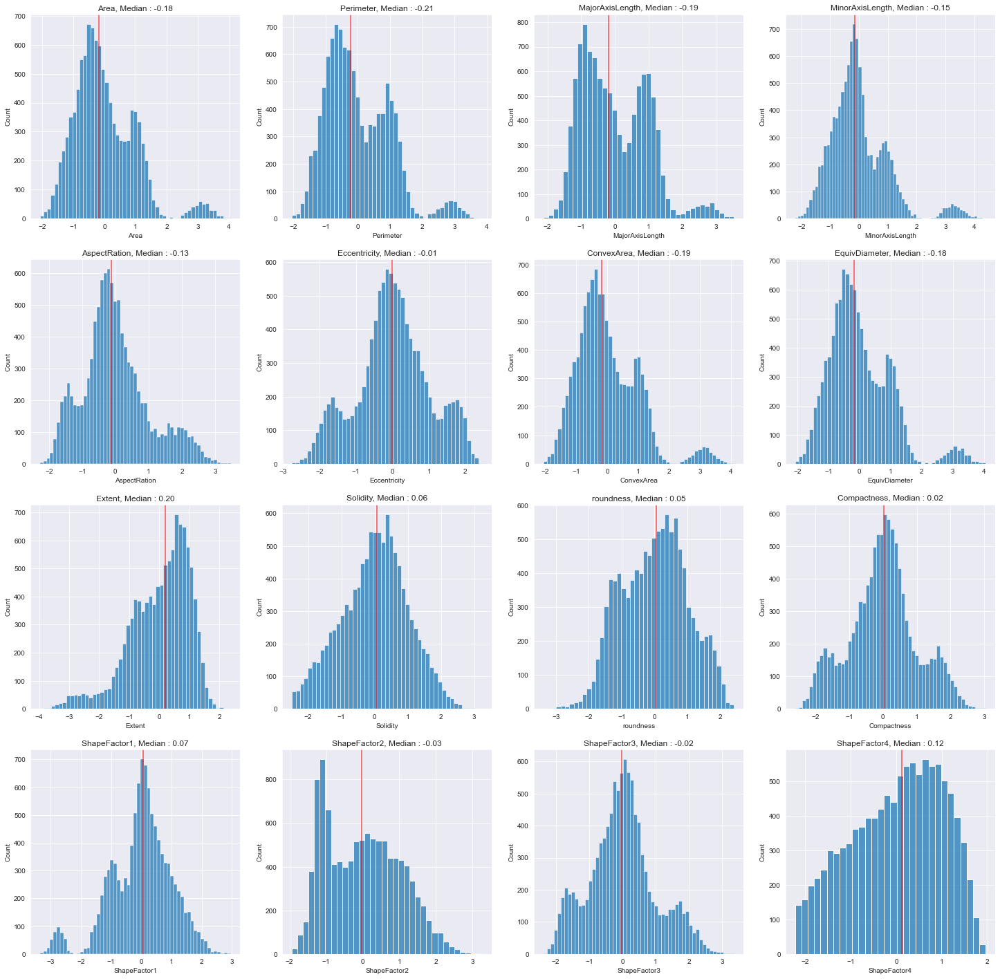

In [33]:
fig, ax_list = plt.subplots(nrows=4, ncols=4, figsize=(25,25))
for feature, ax in zip(x_train, ax_list.flatten()):
     sns.histplot(data= x_train, 
                  x=feature, 
                  ax=ax)
     median = x_train[feature].median()
     ax.set_title( f'{feature}, Median : {median:0.2f}')
     ax.axvline(median,
            color ='red', 
            lw=2, 
            alpha=0.5)
plt.show()

## MODEL CREATING

In [34]:
mdls_class_acc = []
models = []
predictions = []

In [128]:
class_labels=['BARBUNYA', 'BOMBAY', 'CALI', 'DERMASON', 'HOROZ', 'SEKER', 'SIRA']

In [35]:
# Insert model name, prediction values, accuracy rate of classes into relevant dataframes
def add_(y_test, y_pred, mdl_name):
    
    models.append(mdl_name)
    predictions.append(y_pred)
    
    conf_mat = confusion_matrix(y_test, y_pred)
    mdls_class_acc.append((conf_mat.diagonal()/conf_mat.sum(axis=1))*100)

In [159]:
def print_conf_matrix(y_test, y_pred, mdl_name):
    

    labels=['BARBUNYA', 'BOMBAY', 'CALI', 'DERMASON', 'HOROZ', 'SEKER', 'SIRA']
    plt.figure(figsize=(8,5))
    conf_mat = confusion_matrix(y_test, y_pred)

    ax = sns.heatmap(conf_mat, annot=True, cmap='BuPu',fmt='g',annot_kws={"size": 13})

    ax.set_title(f'{mdl_name} Confusion Matrix\n');
    ax.set_xlabel('\nPredicted Values')
    ax.set_ylabel('Actual Values');

    ax.xaxis.set_ticklabels(labels)
    ax.yaxis.set_ticklabels(labels,rotation=45)
    plt.show()

### SUPPORT VECTOR MACHINE (SVM)

In [38]:
# Hyperparameter tuning with Grid Search and model training
param_svm = {'C': [0.01, 0.1, 1, 10, 100], 
             'gamma': [0.01, 0.1, 1, 10, 100], 
             'kernel': ['rbf']}
svm = GridSearchCV(SVC(decision_function_shape='ovo'), param_svm, cv=5)
svm.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=SVC(decision_function_shape='ovo'),
             param_grid={'C': [0.01, 0.1, 1, 10, 100],
                         'gamma': [0.01, 0.1, 1, 10, 100], 'kernel': ['rbf']})

In [39]:
print(svm.best_score_)
print(svm.best_params_)

0.9304967784628062
{'C': 1, 'gamma': 0.1, 'kernel': 'rbf'}


In [40]:
# Prediction
y_pred_svm = svm.predict(x_test)

In [41]:
add_(y_test, y_pred_svm, 'SVM')
print(classification_report(y_test, y_pred_svm))

              precision    recall  f1-score   support

    BARBUNYA       0.96      0.92      0.94       259
      BOMBAY       1.00      1.00      1.00       114
        CALI       0.94      0.97      0.95       305
    DERMASON       0.92      0.92      0.92       707
       HOROZ       0.97      0.95      0.96       376
       SEKER       0.95      0.95      0.95       414
        SIRA       0.88      0.89      0.88       534

    accuracy                           0.93      2709
   macro avg       0.95      0.94      0.94      2709
weighted avg       0.93      0.93      0.93      2709



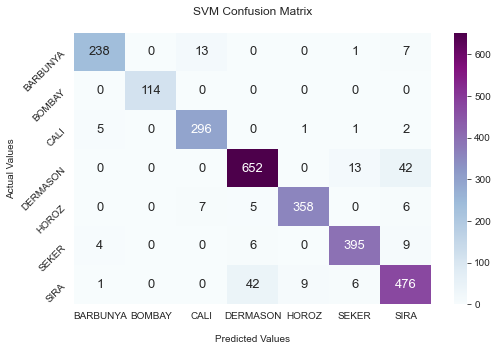

In [160]:
print_conf_matrix(y_test, y_pred_svm, 'SVM')

### K-NEAREST NEIGHBORS (KNN)

In [43]:
# Hyperparameter tuning with Grid Search and model training
k_range = list(range(5, 31))
weight = ['uniform', 'distance']
param_knn = {
    'n_neighbors': k_range,
    'weights': weight
}

knn = GridSearchCV(KNeighborsClassifier(), param_knn, cv=5)
knn.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15,
                                         16, 17, 18, 19, 20, 21, 22, 23, 24, 25,
                                         26, 27, 28, 29, 30],
                         'weights': ['uniform', 'distance']})

In [44]:
print(knn.best_score_)
print(knn.best_params_)

0.9256974742006451
{'n_neighbors': 10, 'weights': 'distance'}


In [45]:
# Prediction
y_pred_knn = knn.predict(x_test)

In [46]:
add_(y_test, y_pred_knn, 'KNN')
print(classification_report(y_test, y_pred_knn))

              precision    recall  f1-score   support

    BARBUNYA       0.95      0.89      0.92       259
      BOMBAY       1.00      1.00      1.00       114
        CALI       0.91      0.97      0.94       305
    DERMASON       0.93      0.91      0.92       707
       HOROZ       0.97      0.95      0.96       376
       SEKER       0.95      0.94      0.95       414
        SIRA       0.86      0.90      0.88       534

    accuracy                           0.93      2709
   macro avg       0.94      0.94      0.94      2709
weighted avg       0.93      0.93      0.93      2709



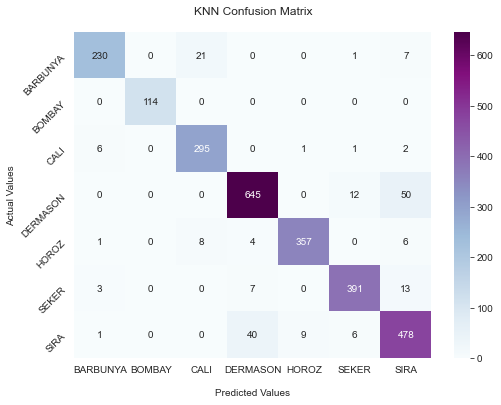

In [47]:
print_conf_matrix(y_test, y_pred_knn, 'KNN')

### DECISION TREE (DT)

In [48]:
# Hyperparameter tuning with Grid Search and model training
param_dt = {'criterion': ['entropy', 'gini'], 'max_depth': [4,5,6,7,8,9,10,None]}
             
dt = GridSearchCV(DecisionTreeClassifier(), param_dt, cv=5)
dt.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': [4, 5, 6, 7, 8, 9, 10, None]})

In [49]:
print(dt.best_score_)
print(dt.best_params_)

0.9071440532694524
{'criterion': 'gini', 'max_depth': 8}


In [50]:
# Prediction
y_pred_dt = dt.predict(x_test)

In [51]:
add_(y_test, y_pred_dt, 'DT')
print(classification_report(y_test, y_pred_dt))

              precision    recall  f1-score   support

    BARBUNYA       0.90      0.89      0.90       259
      BOMBAY       1.00      1.00      1.00       114
        CALI       0.92      0.93      0.93       305
    DERMASON       0.89      0.90      0.90       707
       HOROZ       0.94      0.94      0.94       376
       SEKER       0.94      0.91      0.92       414
        SIRA       0.86      0.86      0.86       534

    accuracy                           0.91      2709
   macro avg       0.92      0.92      0.92      2709
weighted avg       0.91      0.91      0.91      2709



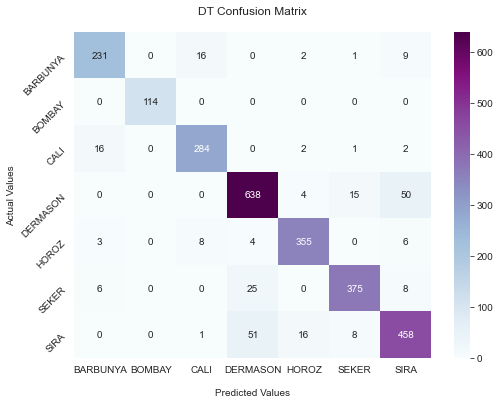

In [52]:
print_conf_matrix(y_test, y_pred_dt, 'DT')

### LOGISTIC REGRESSION (LR)

In [53]:
# Hyperparameter tuning with Grid Search and model training
param_lr = { 'penalty' : ['l1','l2'], 
    'C'       : np.logspace(-3,3,7),
    'solver'  : ['newton-cg', 'lbfgs', 'liblinear']}

lr = GridSearchCV(LogisticRegression(), param_lr, cv=5)
lr.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l1', 'l2'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear']})

In [54]:
print(lr.best_score_)
print(lr.best_params_)

0.9286504824955548
{'C': 1000.0, 'penalty': 'l2', 'solver': 'newton-cg'}


In [55]:
# Prediction
y_pred_lr = lr.predict(x_test)

In [56]:
add_(y_test, y_pred_lr, 'LR')
print(classification_report(y_test, y_pred_lr))

              precision    recall  f1-score   support

    BARBUNYA       0.94      0.92      0.93       259
      BOMBAY       1.00      1.00      1.00       114
        CALI       0.93      0.95      0.94       305
    DERMASON       0.93      0.91      0.92       707
       HOROZ       0.97      0.95      0.96       376
       SEKER       0.95      0.95      0.95       414
        SIRA       0.86      0.89      0.87       534

    accuracy                           0.93      2709
   macro avg       0.94      0.94      0.94      2709
weighted avg       0.93      0.93      0.93      2709



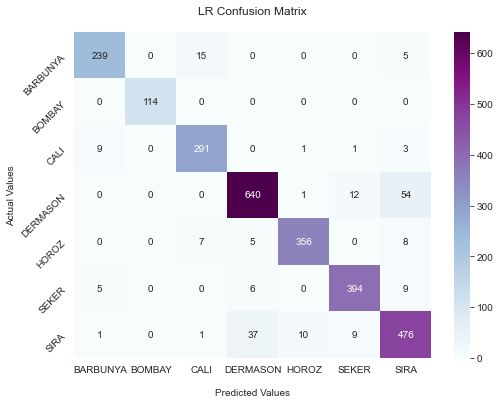

In [57]:
print_conf_matrix(y_test, y_pred_lr, 'LR')

### RANDOM FOREST (RF)

In [58]:
# Hyperparameter tuning with Grid Search and model training
param_rf = {
    'n_estimators': [5, 50, 100],
    'max_depth': [10, 20, 25, 50, None]}

rf = GridSearchCV(RandomForestClassifier(), param_rf, cv=5)
rf.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'max_depth': [10, 20, 25, 50, None],
                         'n_estimators': [5, 50, 100]})

In [59]:
print(rf.best_score_)
print(rf.best_params_)

0.9247739853361574
{'max_depth': 20, 'n_estimators': 50}


In [60]:
# Prediction
y_pred_rf = rf.predict(x_test)

In [61]:
add_(y_test, y_pred_rf, 'RF')
print(classification_report(y_test, y_pred_rf))

              precision    recall  f1-score   support

    BARBUNYA       0.92      0.88      0.90       259
      BOMBAY       1.00      1.00      1.00       114
        CALI       0.91      0.95      0.93       305
    DERMASON       0.91      0.92      0.91       707
       HOROZ       0.97      0.94      0.95       376
       SEKER       0.94      0.94      0.94       414
        SIRA       0.87      0.87      0.87       534

    accuracy                           0.92      2709
   macro avg       0.93      0.93      0.93      2709
weighted avg       0.92      0.92      0.92      2709



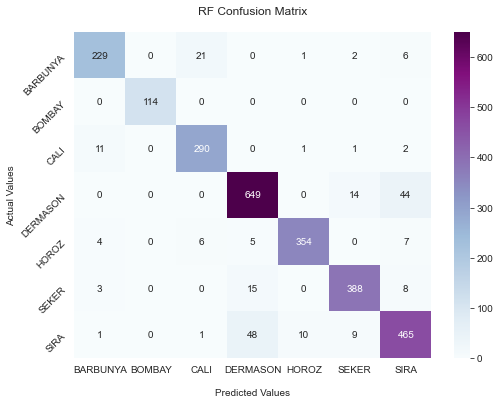

In [62]:
print_conf_matrix(y_test, y_pred_rf, 'RF')

### MULTILAYER PERCEPTRON (MLP)

In [63]:
# Hyperparameter tuning with Grid Search and model training
param_mlp = {
    'hidden_layer_sizes': [(10,),(20,)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'alpha': [0.0001, 0.05],
    'learning_rate': ['constant','adaptive'],
    'max_iter' : [100, 200, 500]
}


mlp = GridSearchCV(MLPClassifier(), param_mlp, cv=5)

mlp.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=MLPClassifier(),
             param_grid={'activation': ['tanh', 'relu'],
                         'alpha': [0.0001, 0.05],
                         'hidden_layer_sizes': [(10,), (20,)],
                         'learning_rate': ['constant', 'adaptive'],
                         'max_iter': [100, 200, 500],
                         'solver': ['sgd', 'adam']})

In [64]:
print(mlp.best_score_)
print(mlp.best_params_)

0.9317891004196669
{'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (20,), 'learning_rate': 'adaptive', 'max_iter': 500, 'solver': 'adam'}


In [65]:
# Prediction
y_pred_mlp = mlp.predict(x_test)

In [66]:
add_(y_test, y_pred_mlp, 'MLP')
print(classification_report(y_test, y_pred_mlp))

              precision    recall  f1-score   support

    BARBUNYA       0.96      0.93      0.95       259
      BOMBAY       1.00      1.00      1.00       114
        CALI       0.93      0.98      0.95       305
    DERMASON       0.92      0.93      0.92       707
       HOROZ       0.95      0.95      0.95       376
       SEKER       0.96      0.95      0.96       414
        SIRA       0.88      0.87      0.87       534

    accuracy                           0.93      2709
   macro avg       0.94      0.94      0.94      2709
weighted avg       0.93      0.93      0.93      2709



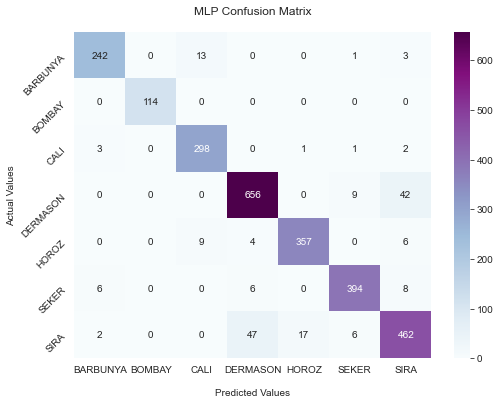

In [67]:
print_conf_matrix(y_test, y_pred_mlp, 'MLP')

### ENSEMBLE METHOD - VOTING CLASSIFIER

In [68]:
ens_class_acc = []
ens_models = []

In [69]:
# Group of Models
mdl_mlp = model_mlp = MLPClassifier(hidden_layer_sizes = (20,),
                            activation = 'relu',
                            solver = 'adam',
                            alpha = 0.0001,
                            learning_rate = 'adaptive',
                            max_iter = 500)
mdl_svm = SVC(C=1, gamma=0.1, kernel ='rbf', decision_function_shape='ovo', probability=True)
mdl_knn = KNeighborsClassifier(n_neighbors=10, weights='distance')
mdl_dt = DecisionTreeClassifier(criterion = 'gini', max_depth = 7)
mdl_lr =LogisticRegression(C= 1000.0, penalty= 'l2', solver= 'newton-cg')
mdl_rf = RandomForestClassifier(n_estimators=50, max_depth=20)

estimator=[]
estimator.append(('mlp', mdl_mlp))
estimator.append(('svm', mdl_svm))
estimator.append(('knn', mdl_knn))
estimator.append(('dt', mdl_dt))
estimator.append(('lr', mdl_lr))
estimator.append(('rf', mdl_rf))

In [70]:
# Voting Classifier with hard voting
vot_hard = VotingClassifier(estimators = estimator, voting ='hard')
vot_hard.fit(x_train, y_train) # Model training
y_pred_hardVoting = vot_hard.predict(x_test) # Prediction

score = accuracy_score(y_test, y_pred_hardVoting)
print("Hard Voting Score % d" % score)  
print(round(accuracy_score(y_test, y_pred_hardVoting),3))

Hard Voting Score  0
0.93


In [71]:
add_(y_test, y_pred_hardVoting, 'HardVoting')
print(classification_report(y_test, y_pred_hardVoting))

              precision    recall  f1-score   support

    BARBUNYA       0.95      0.92      0.94       259
      BOMBAY       1.00      1.00      1.00       114
        CALI       0.93      0.96      0.95       305
    DERMASON       0.92      0.92      0.92       707
       HOROZ       0.96      0.95      0.96       376
       SEKER       0.95      0.95      0.95       414
        SIRA       0.88      0.88      0.88       534

    accuracy                           0.93      2709
   macro avg       0.94      0.94      0.94      2709
weighted avg       0.93      0.93      0.93      2709



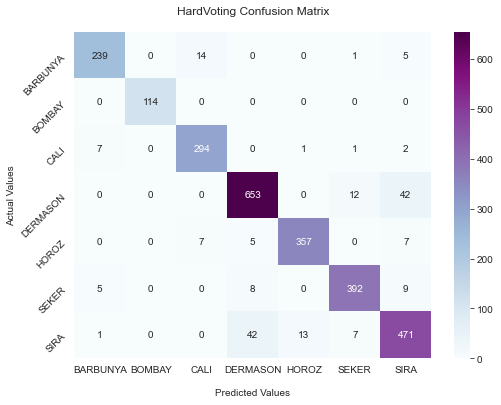

In [72]:
print_conf_matrix(y_test, y_pred_hardVoting, 'HardVoting')

In [73]:
# Voting Classifier with soft voting
vot_soft = VotingClassifier(estimators = estimator, voting ='soft')
vot_soft.fit(x_train, y_train) # Model training
y_pred_softVoting = vot_soft.predict(x_test) # Prediction

score = accuracy_score(y_test, y_pred_softVoting)
print("Soft Voting Score % d" % score)  
print(round(accuracy_score(y_test, y_pred_softVoting),3))

Soft Voting Score  0
0.927


In [74]:
add_(y_test, y_pred_softVoting, 'SoftVoting')
print(classification_report(y_test, y_pred_softVoting))

              precision    recall  f1-score   support

    BARBUNYA       0.94      0.91      0.93       259
      BOMBAY       1.00      1.00      1.00       114
        CALI       0.93      0.96      0.94       305
    DERMASON       0.92      0.92      0.92       707
       HOROZ       0.96      0.95      0.96       376
       SEKER       0.95      0.94      0.95       414
        SIRA       0.87      0.89      0.88       534

    accuracy                           0.93      2709
   macro avg       0.94      0.94      0.94      2709
weighted avg       0.93      0.93      0.93      2709



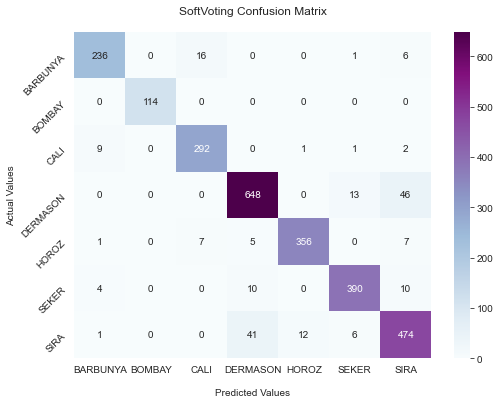

In [75]:
print_conf_matrix(y_test, y_pred_softVoting, 'SoftVoting')

### ENSEMBLE METHOD - STACKING

In [77]:
 from sklearn.ensemble import StackingClassifier

In [78]:
clf = StackingClassifier(estimators=estimator, final_estimator=LogisticRegression())
clf.fit(x_train, y_train)  # Model training
y_pred_Stacking = clf.predict(x_test)  # Prediction

score = accuracy_score(y_test, y_pred_Stacking)
print("Hard Voting Score % d" % score)  
print(round(accuracy_score(y_test, y_pred_Stacking),3))

Hard Voting Score  0
0.931


In [79]:
add_(y_test, y_pred_Stacking, 'Stacking')
print(classification_report(y_test, y_pred_Stacking))

              precision    recall  f1-score   support

    BARBUNYA       0.94      0.92      0.93       259
      BOMBAY       1.00      1.00      1.00       114
        CALI       0.93      0.96      0.94       305
    DERMASON       0.93      0.92      0.92       707
       HOROZ       0.96      0.95      0.96       376
       SEKER       0.95      0.95      0.95       414
        SIRA       0.87      0.90      0.88       534

    accuracy                           0.93      2709
   macro avg       0.94      0.94      0.94      2709
weighted avg       0.93      0.93      0.93      2709



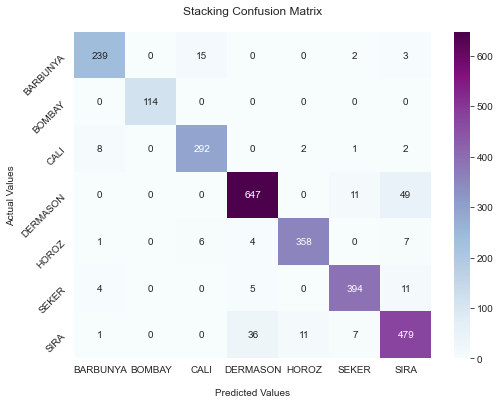

In [81]:
print_conf_matrix(y_test, y_pred_Stacking, 'Stacking')

### PRINCIPAL COMPONENT ANALYSIS (PCA)

**Dimensionality Reduction**

In [113]:
pca_predictions = []
pca_models = []

In [90]:
# Standardization
scaler = StandardScaler()
X = X_train
Y = Y_train
scaled_X = scaler.fit_transform(X)
scaled_X_test = scaler.transform(X_test)

In [91]:
# PCA
pca = PCA(n_components = 0.99)
pca_X = pca.fit_transform(scaled_X)
pca_X_test = pca.transform(scaled_X_test)

In [93]:
# Support Vector Machine Classifier
param_svm = {'C': [0.01, 0.1, 1, 10, 100], 'gamma': [0.01, 0.1, 1, 10, 100], 'kernel': ['rbf']}
model_svm = GridSearchCV(SVC(decision_function_shape='ovo'), param_svm, cv=5, scoring='accuracy', return_train_score=False)
model_svm.fit(pca_X,Y)

GridSearchCV(cv=5, estimator=SVC(decision_function_shape='ovo'),
             param_grid={'C': [0.01, 0.1, 1, 10, 100],
                         'gamma': [0.01, 0.1, 1, 10, 100], 'kernel': ['rbf']},
             scoring='accuracy')

In [94]:
print(model_svm.best_score_)
print(model_svm.best_params_)

0.929481592646518
{'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}


In [114]:
y_pred = model_svm.predict(pca_X_test)
pca_predictions.append(y_pred)
pca_models.append('SVM')
print(classification_report(Y_test, y_pred))

              precision    recall  f1-score   support

    BARBUNYA       0.94      0.92      0.93       259
      BOMBAY       1.00      1.00      1.00       114
        CALI       0.94      0.95      0.94       305
    DERMASON       0.92      0.93      0.92       707
       HOROZ       0.98      0.96      0.97       376
       SEKER       0.95      0.95      0.95       414
        SIRA       0.88      0.89      0.88       534

    accuracy                           0.93      2709
   macro avg       0.94      0.94      0.94      2709
weighted avg       0.93      0.93      0.93      2709



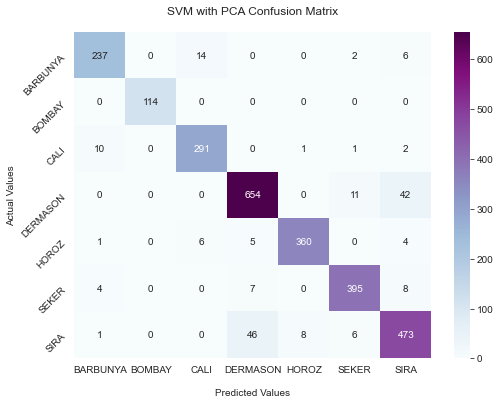

In [115]:
print_conf_matrix(y_test, y_pred, 'SVM with PCA')

In [98]:
# k-Nearest Neighbors Classifier
knn = KNeighborsClassifier()
k_range = list(range(5, 31))
weight = ['uniform', 'distance']
param_knn = {
    'n_neighbors': k_range,
    'weights': weight
}
model_knn = GridSearchCV(knn, param_knn, cv=5, scoring='accuracy', return_train_score=False)
model_knn.fit(pca_X, Y)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15,
                                         16, 17, 18, 19, 20, 21, 22, 23, 24, 25,
                                         26, 27, 28, 29, 30],
                         'weights': ['uniform', 'distance']},
             scoring='accuracy')

In [99]:
print(model_knn.best_score_)
print(model_knn.best_params_)

0.9233894551062036
{'n_neighbors': 15, 'weights': 'distance'}


In [116]:
y_pred = model_knn.predict(pca_X_test)
pca_predictions.append(y_pred)
pca_models.append('KNN')
print(classification_report(Y_test, y_pred))

              precision    recall  f1-score   support

    BARBUNYA       0.95      0.87      0.91       259
      BOMBAY       1.00      1.00      1.00       114
        CALI       0.90      0.96      0.93       305
    DERMASON       0.92      0.91      0.91       707
       HOROZ       0.97      0.95      0.96       376
       SEKER       0.93      0.94      0.94       414
        SIRA       0.87      0.88      0.87       534

    accuracy                           0.92      2709
   macro avg       0.93      0.93      0.93      2709
weighted avg       0.92      0.92      0.92      2709



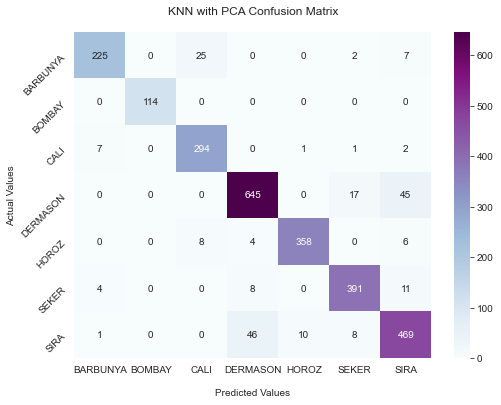

In [117]:
print_conf_matrix(y_test, y_pred, 'KNN with PCA')

In [102]:
# Decision Tree Classifier 
param_dt = {'criterion': ['entropy', 'gini'], 'max_depth': [4,5,6,7,8,9,10,None]}
model_dt = GridSearchCV(DecisionTreeClassifier(), param_dt, cv=5, scoring='accuracy', return_train_score=False)
model_dt.fit(pca_X,Y)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': [4, 5, 6, 7, 8, 9, 10, None]},
             scoring='accuracy')

In [103]:
print(model_dt.best_score_)
print(model_dt.best_params_)

0.9065901218691691
{'criterion': 'entropy', 'max_depth': 7}


In [118]:
y_pred = model_dt.predict(pca_X_test)
pca_predictions.append(y_pred)
pca_models.append('DT')
print(classification_report(Y_test, y_pred))

              precision    recall  f1-score   support

    BARBUNYA       0.93      0.88      0.90       259
      BOMBAY       1.00      1.00      1.00       114
        CALI       0.91      0.96      0.94       305
    DERMASON       0.92      0.88      0.90       707
       HOROZ       0.94      0.93      0.94       376
       SEKER       0.94      0.93      0.93       414
        SIRA       0.82      0.87      0.85       534

    accuracy                           0.91      2709
   macro avg       0.92      0.92      0.92      2709
weighted avg       0.91      0.91      0.91      2709



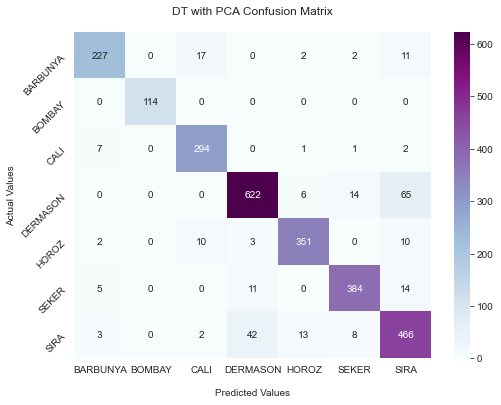

In [119]:
print_conf_matrix(y_test, y_pred, 'DT with PCA')

In [106]:
# Logistic Regression Classifier
param_log = { 'penalty' : ['l1','l2'], 
    'C'       : np.logspace(-3,3,7),
    'solver'  : ['newton-cg', 'lbfgs', 'liblinear']}

model_log = GridSearchCV(LogisticRegression(), param_log, cv=5, scoring='accuracy', return_train_score=False)
model_log.fit(pca_X,Y)

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l1', 'l2'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear']},
             scoring='accuracy')

In [107]:
print(model_log.best_score_)
print(model_log.best_params_)

0.9250510788666222
{'C': 1000.0, 'penalty': 'l2', 'solver': 'lbfgs'}


In [120]:
y_pred = model_log.predict(pca_X_test)
pca_predictions.append(y_pred)
pca_models.append('LR')
print(classification_report(Y_test, y_pred))

              precision    recall  f1-score   support

    BARBUNYA       0.93      0.92      0.92       259
      BOMBAY       1.00      1.00      1.00       114
        CALI       0.93      0.94      0.94       305
    DERMASON       0.93      0.89      0.91       707
       HOROZ       0.96      0.95      0.96       376
       SEKER       0.94      0.94      0.94       414
        SIRA       0.84      0.88      0.86       534

    accuracy                           0.92      2709
   macro avg       0.93      0.93      0.93      2709
weighted avg       0.92      0.92      0.92      2709



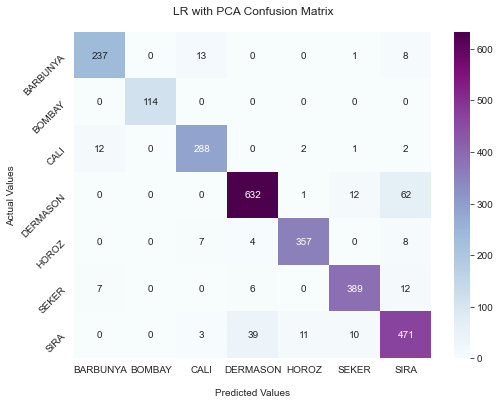

In [121]:
print_conf_matrix(y_test, y_pred, 'LR with PCA')

In [110]:
# Random Forest Classifier
param_rf = {
    'n_estimators': [5, 50, 100],
    'max_depth': [10, 20, 25, 50, None]}

model_rf = GridSearchCV(RandomForestClassifier(), param_rf, cv=5, scoring='accuracy', return_train_score=False)
model_rf.fit(pca_X,Y)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'max_depth': [10, 20, 25, 50, None],
                         'n_estimators': [5, 50, 100]},
             scoring='accuracy')

In [111]:
print(model_rf.best_score_)
print(model_rf.best_params_)

0.9256969628793525
{'max_depth': 50, 'n_estimators': 100}


In [122]:
y_pred = model_rf.predict(pca_X_test)
pca_predictions.append(y_pred)
pca_models.append('RF')
print(classification_report(Y_test, y_pred))

              precision    recall  f1-score   support

    BARBUNYA       0.94      0.92      0.93       259
      BOMBAY       1.00      1.00      1.00       114
        CALI       0.93      0.96      0.95       305
    DERMASON       0.91      0.93      0.92       707
       HOROZ       0.96      0.95      0.95       376
       SEKER       0.95      0.95      0.95       414
        SIRA       0.88      0.86      0.87       534

    accuracy                           0.93      2709
   macro avg       0.94      0.94      0.94      2709
weighted avg       0.93      0.93      0.93      2709



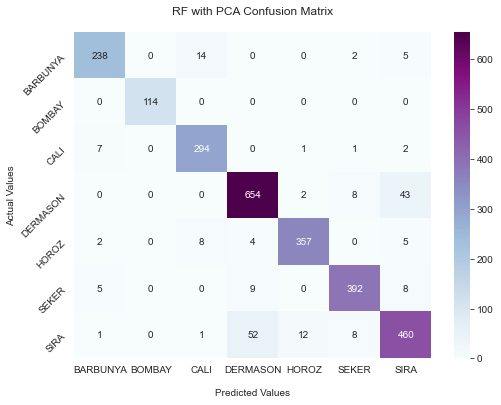

In [123]:
print_conf_matrix(y_test, y_pred, 'RF with PCA')

In [ ]:
# Multilayer Perceptron Classifier
param_mlp = {
    'hidden_layer_sizes': [(10,),(20,)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'alpha': [0.0001, 0.05],
    'learning_rate': ['constant','adaptive'],
    'max_iter' : [100, 200, 500]
}

model_mlp = GridSearchCV(MLPClassifier(), param_mlp, cv=5, scoring='accuracy', return_train_score=False)
model_mlp.fit(pca_X,Y)

In [ ]:
print(model_mlp.best_score_)
print(model_mlp.best_params_)

In [ ]:
y_pred = model_svm.predict(pca_X_test)
pca_predictions.append(y_pred)
pca_models.append('MLP')
print(classification_report(Y_test, y_pred))

In [ ]:
print_conf_matrix(y_test, y_pred, 'MLP with PCA')

## VISUALIZING RESULTS

In [136]:
pca_mdl_metrics = []

for y_pred, mdl in zip(pca_predictions, pca_models):
    accuracy = round(accuracy_score(y_test, y_pred), 3)*100
    precision = round(precision_score(y_test, y_pred, average='macro'), 3)*100
    recall = round(recall_score(y_test, y_pred, average='macro'), 3)*100
    f1 = round(f1_score(y_test, y_pred, average='macro'), 3)*100
   
    pca_mdl_metrics.append([accuracy,precision,recall,f1])
    
pca_tbl_metrics = pd.DataFrame(columns=pca_models,
                            index=['Accuracy %', 'Precision %', 'Recall %', 'F1 %'])
i=0
for mdl in pca_mdl_metrics:

    col = pca_tbl_metrics.columns[i]
    pca_tbl_metrics[col] = mdl       
    i = i+1

In [137]:
mdl_metrics = []

for y_pred, mdl in zip(predictions ,models):
    accuracy = round(accuracy_score(y_test, y_pred), 3)*100
    precision = round(precision_score(y_test, y_pred, average='macro'), 3)*100
    recall = round(recall_score(y_test, y_pred, average='macro'), 3)*100
    f1 = round(f1_score(y_test, y_pred, average='macro'), 3)*100
   
    mdl_metrics.append([accuracy,precision,recall,f1])
    
table_metrics = pd.DataFrame(columns=models,
                            index=['Accuracy %', 'Precision %', 'Recall %', 'F1 %'])
i=0
for mdl in mdl_metrics:

    col = table_metrics.columns[i]
    table_metrics[col] = mdl       
    i = i+1

In [138]:
tbl_class_acc = pd.DataFrame(columns = models,
                            index = class_labels)

i=0
mdls_class_acc = np.round(mdls_class_acc,1)
for acc in mdls_class_acc:
    col = tbl_class_acc.columns[i]
    tbl_class_acc[col] = acc       
    i = i+1

In [139]:
mdl_accuracy = []
 
for y_pred, mdl in zip(predictions, models):
    accuracy = round(accuracy_score(y_test, y_pred)*100, 2)
    mdl_accuracy.append(accuracy)

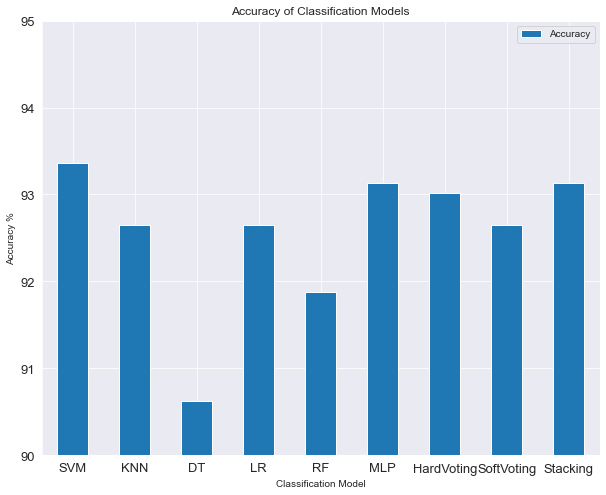

In [140]:
table_accuracy=pd.DataFrame(columns=models, index=['Accuracy'])
i=0
for mdl in mdl_accuracy:
    col=table_accuracy.columns[i] 
    table_accuracy[col] = mdl 
    i = i+1 
table_accuracy.transpose().plot(kind='bar', figsize = (10,8) , ylim=(90,95),fontsize=13, rot = 0,
                    title= "Accuracy of Classification Models",
                    xlabel= 'Classification Model',
                    ylabel= 'Accuracy %');

In [141]:
# Performance Metrics for All Classifier Models
table_metrics

,SVM,KNN,DT,LR,RF,MLP,HardVoting,SoftVoting,Stacking
Accuracy %,93.4,92.7,90.6,92.7,91.9,93.1,93.0,92.7,93.1
Precision %,94.6,93.9,92.0,93.9,93.1,94.3,94.2,93.9,94.2
Recall %,94.4,93.7,91.9,93.9,92.9,94.4,94.1,93.7,94.2
F1 %,94.5,93.8,92.0,93.9,93.0,94.3,94.2,93.8,94.2


In [142]:
# Performance Metrics for PCA Applied Classifier Models
pca_tbl_metrics

,SVM,KNN,DT,LR,RF
Accuracy %,93.2,92.1,90.7,91.8,92.6
Precision %,94.3,93.4,92.3,93.2,93.9
Recall %,94.2,93.1,92.2,93.2,93.8
F1 %,94.2,93.2,92.2,93.2,93.8


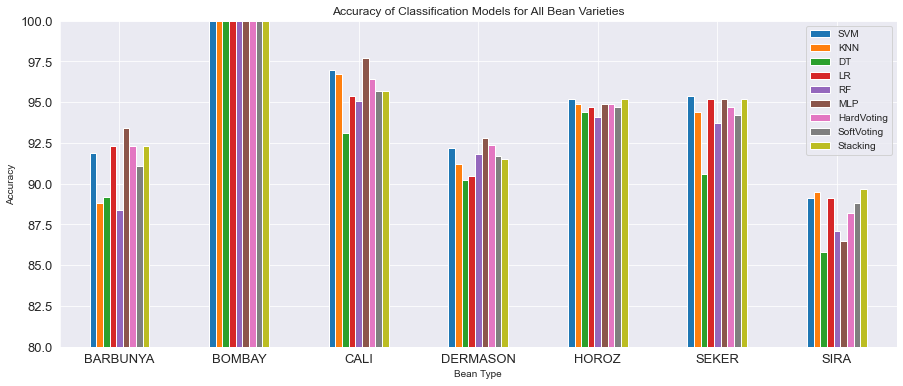

In [143]:
tbl_class_acc.plot(kind='bar', figsize = (15,6) , ylim=(80,100),fontsize=13, rot = 0,
                    title= "Accuracy of Classification Models for All Bean Varieties",
                    xlabel= 'Bean Type',
                    ylabel= 'Accuracy');

In [144]:
# Accuracy of Classification Models for All Bean Varieties
tbl_class_acc

,SVM,KNN,DT,LR,RF,MLP,HardVoting,SoftVoting,Stacking
BARBUNYA,91.9,88.8,89.2,92.3,88.4,93.4,92.3,91.1,92.3
BOMBAY,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0
CALI,97.0,96.7,93.1,95.4,95.1,97.7,96.4,95.7,95.7
DERMASON,92.2,91.2,90.2,90.5,91.8,92.8,92.4,91.7,91.5
HOROZ,95.2,94.9,94.4,94.7,94.1,94.9,94.9,94.7,95.2
SEKER,95.4,94.4,90.6,95.2,93.7,95.2,94.7,94.2,95.2
SIRA,89.1,89.5,85.8,89.1,87.1,86.5,88.2,88.8,89.7
